## Basic Track Analysis
In this guide we'll examine a couple different sets of track data to demostrate how to effectively visualize, query, and analyze the tracks.

This guide assumes that:
1. You are an administrator for your organization OR you are a Track Viewer that has privileges to create content.
2. You are using Enterprise 10.7+
3. You have GeoAnalytics Server as part of your Enterprise deployment
4. You are running this with the latest version of the ArcGIS API for Python

In [1]:
import arcgis
from arcgis.gis import GIS
from arcgis.apps.tracker import TrackView

arcgis.env.process_spatial_reference = "102100"

gis = GIS("https://server.domain.com/webadapter", "username", "password", verify_cert=False)
if not arcgis.geoanalytics.is_supported(gis):
    raise Exception("GeoAnalytics is not supported for this organization")

### Access track data through the track view
We are going to be using a specific track view that contains tracks for several members of the Tracker product team.

In [2]:
track_view = TrackView(gis.content.get("f467d6408d264adfb323a81fb4c144eb"))

### Let's see who is tracked in this track view

In [3]:
print(track_view.mobile_users.list())

['apulver', 'cgillgrass', 'hmccracken', 'jshaner', 'jwhitney', 'bpierce', 'cghostine', 'dnyenhuis', 'ericito', 'devsummit', 'mbockenhauer', 'tmorey', 'kdonia', 'dmorgenthaler', 'ccouture', 'jshanerAndroid', 'jjackson', 'gagandeep', 'nchowdhury', 'allencarroll', 'dereklaw', 'chrislesueur', 'tbeauchamp', 'jrowlingson', 'apulver2', 'wkotlewski']


### Let's see the tracks during the Developer Summit
Many members of the Tracker team attended the Esri Developer Summit, we'll start analyzing the tracks recorded during this event.


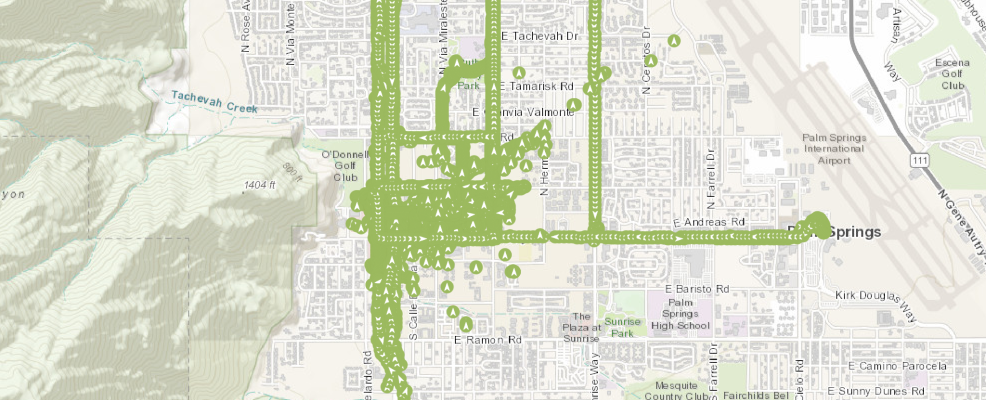

In [5]:
track_view.tracks_layer.filter = "location_timestamp > date '2019-03-04' AND location_timestamp < date '2019-03-08'"
webmap = gis.map("Palm Springs Convention Center, CA", zoomlevel=14)
webmap.add_layer(track_view.tracks_layer)
webmap

It looks like there is some noisy data, let's update the filter to account for that.


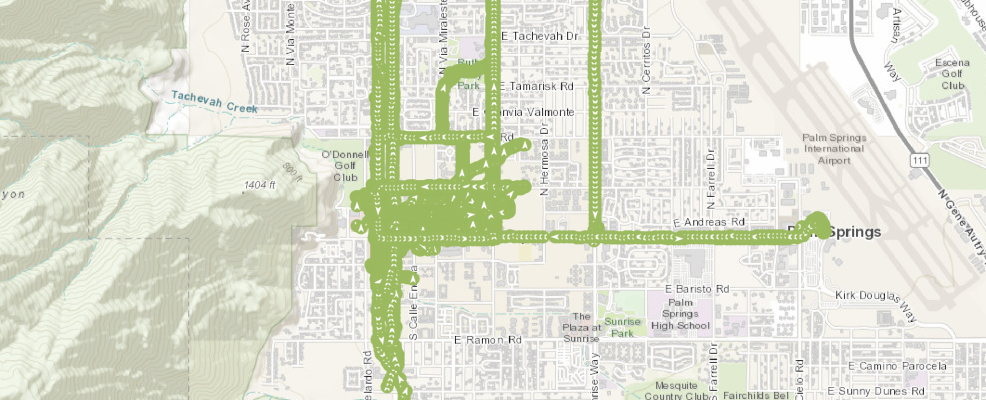

In [7]:
track_view.tracks_layer.filter = "horizontal_accuracy < 100 AND location_timestamp > date '2019-03-04' AND location_timestamp < date '2019-03-08'"
webmap = gis.map("Palm Springs Convention Center, CA", zoomlevel=14)
webmap.add_layer(track_view.tracks_layer)
webmap

Let's use a heatmap renderer to see the most frequently visited locations


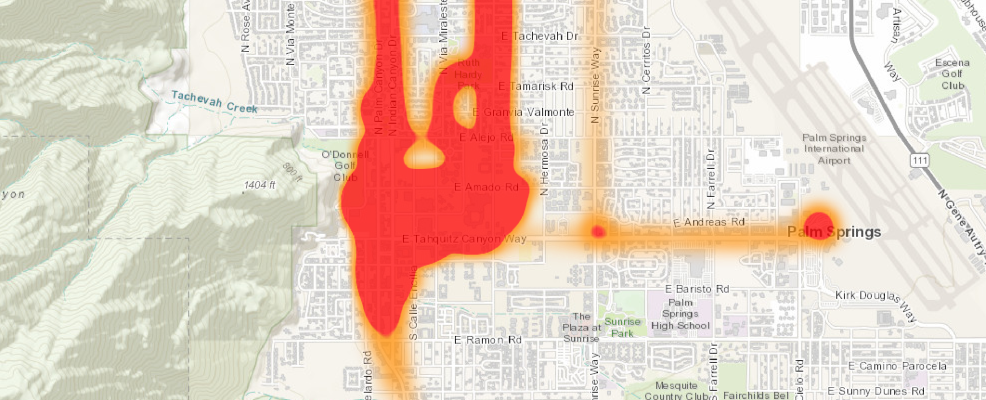

In [9]:
webmap = gis.map("Palm Springs Convention Center, CA", zoomlevel=14)
webmap.add_layer(track_view.tracks_layer, {"renderer": "HEATMAP", "opacity": 0.75})
webmap

### Use some geoanalytics tools to examine the data further
Let's created some aggregated hexagon bins to analyze where the most frequently visted locations were


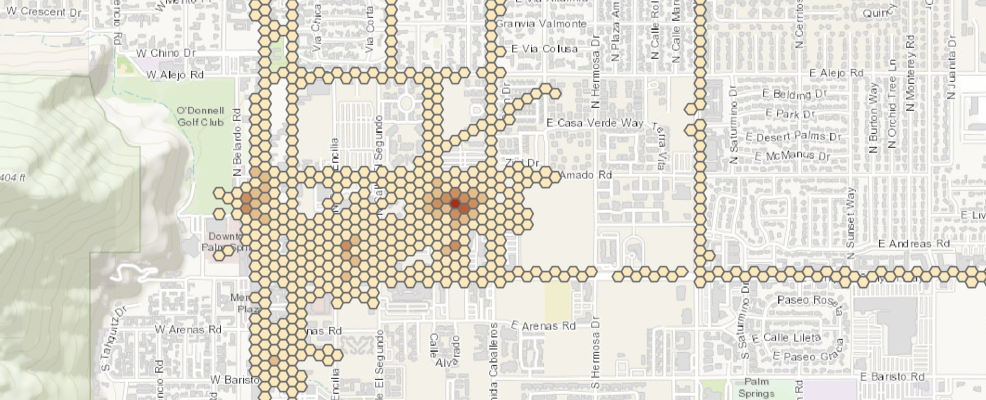

In [11]:
from arcgis.geoanalytics.summarize_data import aggregate_points
aggregated_tracks = aggregate_points(point_layer=track_view.tracks_layer,
                                     bin_size=50,
                                     bin_size_unit="Meters",
                                     bin_type="Hexagon")
webmap = gis.map("Palm Springs Convention Center, CA", zoomlevel=15)
webmap.add_layer(aggregated_tracks.layers[0])
webmap

#### Cluster Detection
It looks like there might be some common locations. Let's see if we can identify some clusters.


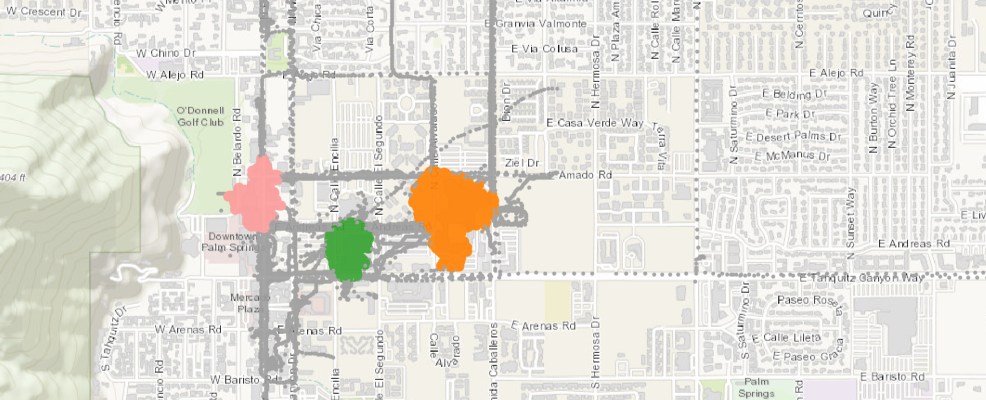

In [13]:
from arcgis.geoanalytics.analyze_patterns import find_point_clusters
clusters = find_point_clusters(
    track_view.tracks_layer,
    "DBSCAN",
    500,
    search_distance=50,
    distance_unit="Meters"
)
webmap = gis.map("Palm Springs Convention Center, CA", zoomlevel=15)
webmap.add_layer(clusters.layers[0])
webmap

#### Build lines
Since all of the track data is stored as lines, we can use the reconstruct tracks tool to generate lines to visualize the actual paths people took.


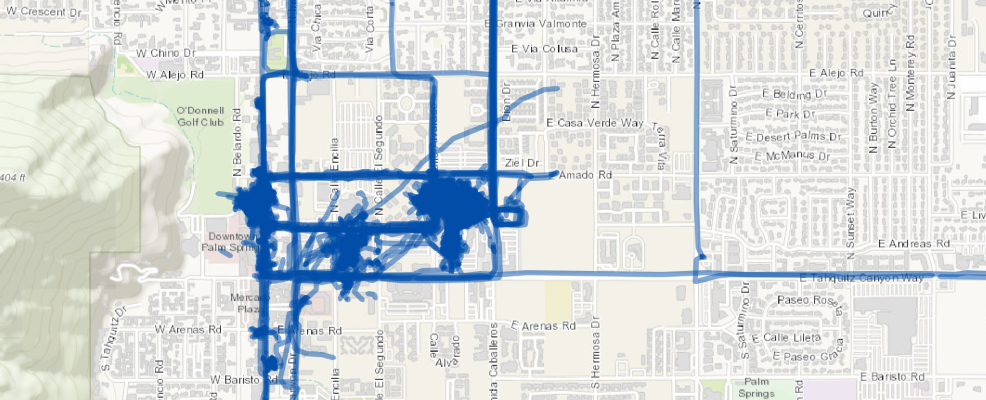

In [15]:
from arcgis.geoanalytics.summarize_data import reconstruct_tracks
track_lines = reconstruct_tracks(track_view.tracks_layer,
                                     track_fields="created_user",
                                     method="Geodesic",
                                     time_boundary_split=5,
                                     time_boundary_split_unit="Minutes",
                                     distance_split=100,
                                     distance_split_unit="Meters"
                               )
webmap = gis.map("Palm Springs Convention Center, CA", zoomlevel=15)
webmap.add_layer(track_lines.layers[0], {"renderer":{"type":"simple","symbol":{"color":[0,77,168,126],"width":3.75,"type":"esriSLS","style":"esriSLSSolid"}},"transparency":0})
webmap

###  Examine a specific user's track data
It's still a bit difficult to see who went where, let's add a filter to the track lines to only show tracks for `apulver`.


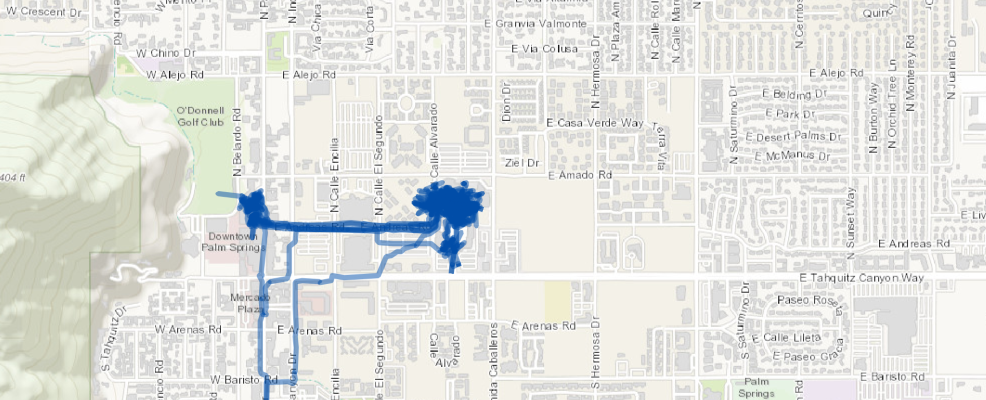

In [17]:
track_lines.layers[0].filter = "created_user = 'apulver'"
webmap = gis.map("Palm Springs Convention Center, CA", zoomlevel=15)
webmap.add_layer(track_lines.layers[0], {"renderer":{"type":"simple","symbol":{"color":[0,77,168,126],"width":3.75,"type":"esriSLS","style":"esriSLSSolid"}},"transparency":0})
webmap

Let's dig into the `apulver`'s tracks a bit more and see what data is available

In [18]:
apulver_tracks = track_view.tracks_layer.query(where="created_user = 'apulver' AND horizontal_accuracy < 100 AND location_timestamp > date '2019-03-04' AND location_timestamp < date '2019-03-08'", as_df=True)
apulver_tracks.head(5)

,SHAPE,activity,altitude,app_id,battery_percentage,battery_state,course,created_date,created_user,device_id,...,horizontal_accuracy,last_edited_date,last_edited_user,location_source,location_timestamp,objectid,session_id,signal_strength,speed,vertical_accuracy
0,"{""x"": -116.547366953, ""y"": 33.82579257200007, ...",2,9.446757,tracker,100.0,1,172.839399,2019-03-04 17:35:02.938999891,apulver,None,...,55.695708,2019-03-04 17:35:02.938999891,apulver,None,2019-03-04 17:24:39.992000103,356138,None,None,1.022645,6.430488
1,"{""x"": -116.54722025499996, ""y"": 33.82566290800...",2,34.393793,tracker,100.0,1,175.942340,2019-03-04 17:35:02.938999891,apulver,None,...,47.702609,2019-03-04 17:35:02.938999891,apulver,None,2019-03-04 17:24:52.990999937,356142,None,None,1.419557,4.890441
2,"{""x"": -116.54713261799998, ""y"": 33.82553818500...",2,69.119616,tracker,100.0,1,185.610090,2019-03-04 17:35:02.938999891,apulver,None,...,45.839481,2019-03-04 17:35:02.938999891,apulver,None,2019-03-04 17:25:04.990999937,356146,None,None,0.703469,4.845510
3,"{""x"": -116.54706820099995, ""y"": 33.82511825000...",2,141.351143,tracker,100.0,1,126.716156,2019-03-04 17:35:02.938999891,apulver,None,...,32.004833,2019-03-04 17:35:02.938999891,apulver,None,2019-03-04 17:25:37.990000010,356155,None,None,1.181916,3.000000
4,"{""x"": -116.54676218999998, ""y"": 33.82502554200...",2,141.351143,tracker,100.0,1,84.524267,2019-03-04 17:35:02.938999891,apulver,None,...,32.004833,2019-03-04 17:35:02.938999891,apulver,None,2019-03-04 17:25:52.993999958,356160,None,None,1.209855,3.000000


In [19]:
# Convert UTC to Pacific time
from datetime import timedelta
apulver_tracks['location_timestamp'] -= timedelta(hours=9)

#### Plot Battery Life

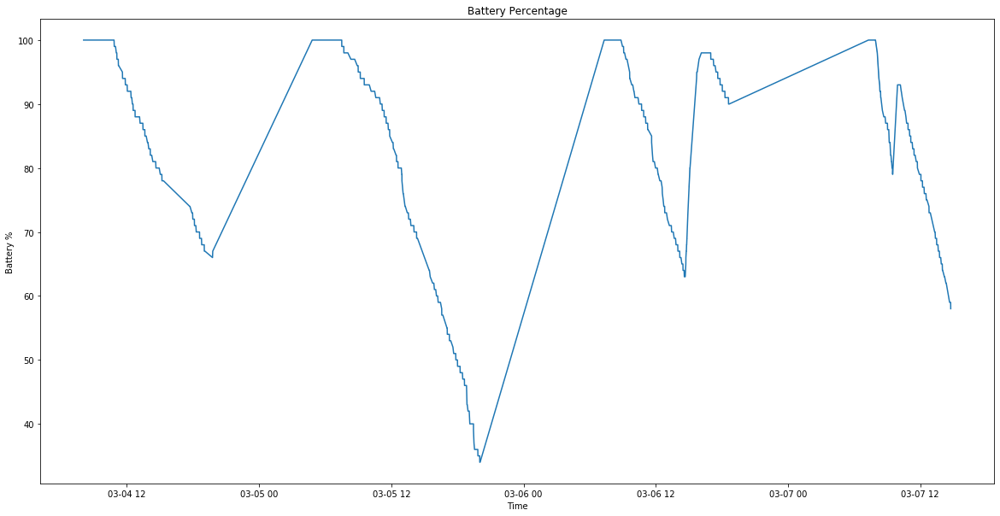

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
%matplotlib inline

plt.rcParams['figure.figsize'] = [20, 10]
register_matplotlib_converters()

g = sns.lineplot(x="location_timestamp", y="battery_percentage", data=apulver_tracks)
g.set(xlabel='Time', ylabel='Battery %', title="Battery Percentage");

#### Plot Accuracy

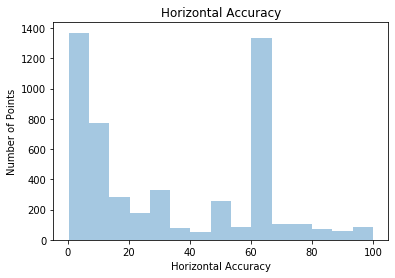

In [21]:
g = sns.distplot(apulver_tracks["horizontal_accuracy"], kde=False, rug=False)
g.set(xlabel='Horizontal Accuracy', ylabel='Number of Points', title="Horizontal Accuracy");

### Deriving new datasets
Let's look at this same user but at in Portland, ME and analyze their driving habits


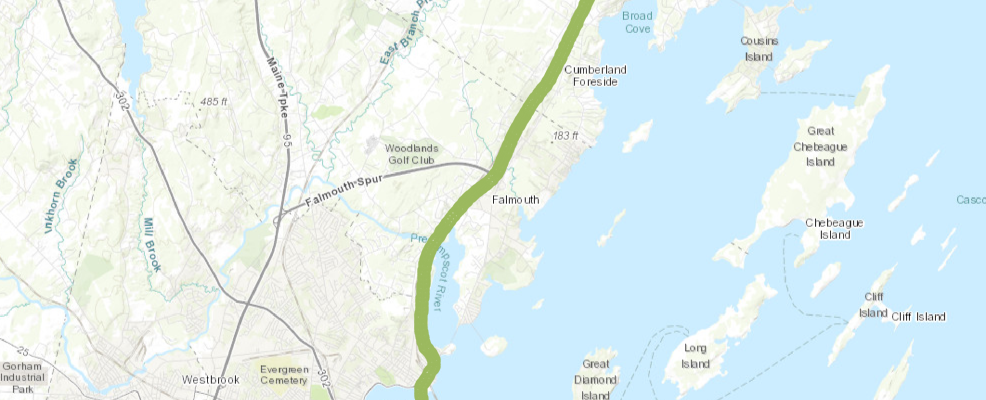

In [23]:
track_view.tracks_layer.filter = "activity = 5 AND created_user = 'apulver' AND horizontal_accuracy < 100 AND location_timestamp > date '2019-07-01' AND location_timestamp < date '2019-07-02'"
webmap = gis.map("Falmouth, ME", zoomlevel=12)
webmap.add_layer(track_view.tracks_layer)
webmap

Let's render the points based on the speed. Darker orange/red will indicate a higher speed.


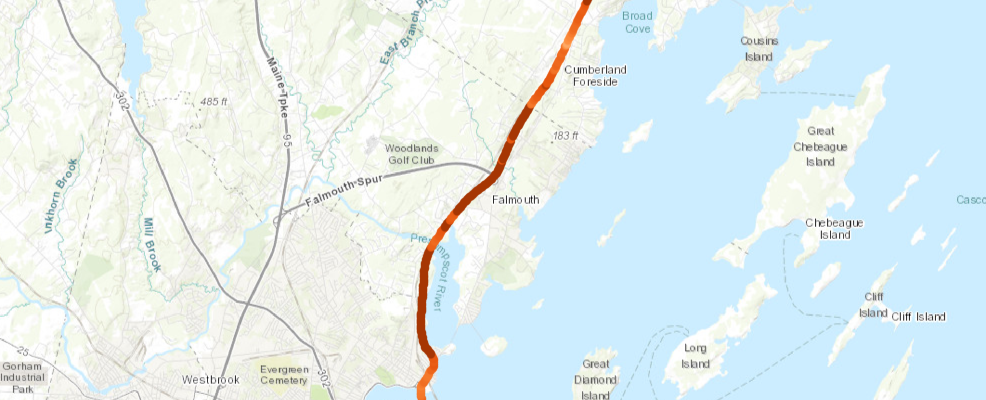

In [25]:
renderer = {"visualVariables": [
    {"type": "colorInfo",
     "field": "speed",
     "valueExpression": None,
     "stops": [
         {"value": -1, "color": [254, 237, 222, 255], "label": "N/A"},
         {"value": 9.9, "color": [253, 190, 133, 255], "label": "0-10"},
         {"value": 19.9, "color": [253, 141, 60, 255], "label": "10-20"},
         {"value": 29.9, "color": [230, 85, 13, 255], "label": "20-30"},
         {"value": 30, "color": [166, 54, 3, 255], "label": "> 30+"}
     ]
     }
],
    "type": "classBreaks",
    "field": "speed",
    "minValue": 0,
    "classBreakInfos": [
        {"symbol":
             {"color": [170, 170, 170, 255],
              "size": 6,
              "angle": 0,
              "xoffset": 0,
              "yoffset": 0,
              "type": "esriSMS",
              "style": "esriSMSCircle",
              "outline": {
                  "color": None,
                  "width": 0.375,
                  "type": "esriSLS",
                  "style": "esriSLSNull"}},
         "classMaxValue": 100}
    ]
}
webmap = gis.map("Falmouth, ME", zoomlevel=12)
webmap.add_layer(track_view.tracks_layer, {"renderer": renderer})
webmap

You can see how `apulver` speeds up and slows down in certain areas. We can leverage the GeoAnalytics calculate field tool to determine the mean acceleration between consectutive points. This will allow to to see where `apulver` is braking or accelerating.

In [26]:
from arcgis.geoanalytics.manage_data import calculate_fields

acceleration_expression = """
($track.field["speed"].history(-2)[0] - $feature.speed)/(DateDiff($track.field["location_timestamp"].history(-2)[0], $feature.location_timestamp, "seconds"))
"""

acceleration = calculate_fields(track_view.tracks_layer,
                               "acceleration",
                               "Double",
                               acceleration_expression,
                               track_aware=True,
                               track_fields="created_user",
                               )


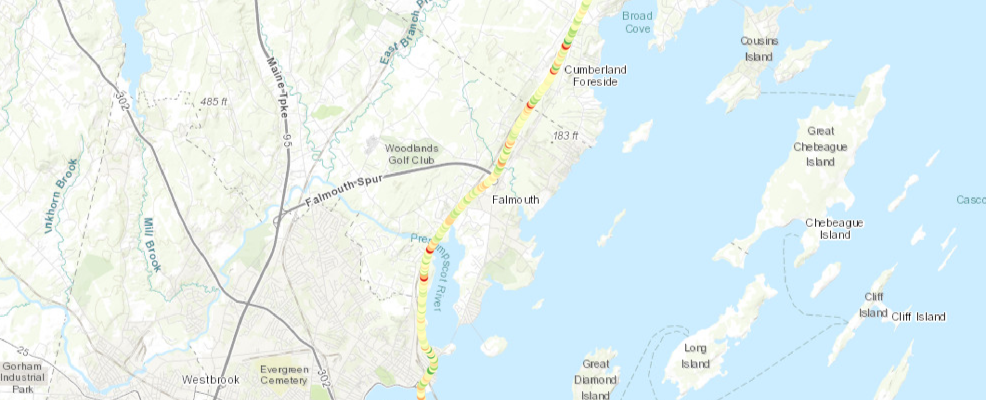

In [28]:
renderer = {"visualVariables": [
    {"type": "colorInfo",
     "field": "acceleration",
     "valueExpression": None,
     "stops": [
         {"value": -2, "color": [215, 25, 28, 255], "label": "Hard-braking"},
         {"value": -1, "color": [253, 174, 97, 255], "label": "Light-braking"},
         {"value": 0, "color": [255, 255, 191, 255], "label": "Normal"},
         {"value": 1, "color": [166, 217, 106, 255], "label": "Light-acceleration"},
         {"value": 2, "color": [26, 150, 65, 255], "label": "Hard-acceleration"}
     ]
     }
],
    "type": "classBreaks",
    "field": "acceleration",
    "minValue": -10,
    "classBreakInfos": [
        {"symbol":
             {"color": [170, 170, 170, 255],
              "size": 6,
              "angle": 0,
              "xoffset": 0,
              "yoffset": 0,
              "type": "esriSMS",
              "style": "esriSMSCircle",
              "outline": {
                  "color": None,
                  "width": 0.375,
                  "type": "esriSLS",
                  "style": "esriSLSNull"}},
         "classMaxValue": 100}
    ]
}
webmap = gis.map("Falmouth, ME", zoomlevel=12)
webmap.add_layer(acceleration.layers[0], {"renderer": renderer})                                   
webmap

You can see there are some red and green dots, let's filter the layer to only show when `apulver` was braking at more than 2 m/s^2.


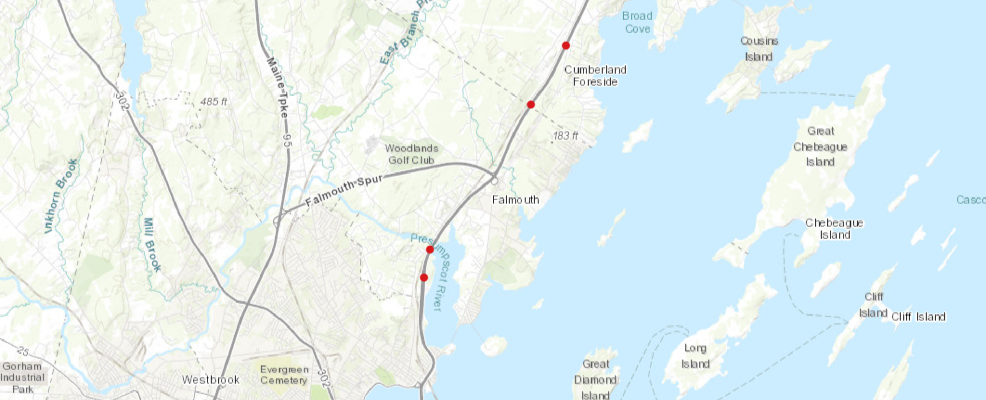

In [30]:
acceleration.layers[0].filter = "acceleration <= -2"
webmap = gis.map("Falmouth, ME", zoomlevel=12)
webmap.add_layer(acceleration.layers[0], {"renderer": renderer})                                   
webmap

### Summary
We just walked through several ways to view, interogate, and analyze track data. The track data can help you answer questions about where some was, how they got there, and how long they were there. The key takeaway is that because the track data is stored in a hosted feature service, it can be leveraged by existing tools in the ArcGIS platform.